In [210]:
import matplotlib.pyplot as plt
import numpy as np
# from matplotlib_venn import venn2, venn2_circles, venn3_unweighted
# from mpl_toolkits.mplot3d import axes3d
# from mpl_toolkits import mplot3d
# from matplotlib_venn import venn3, venn3_circles
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
import matplotlib.patches as patches
import matplotlib.transforms as transforms
import pandas as pd
import seaborn as sns
import os
import sys
import itertools
import logging 
from tqdm import tqdm, trange
# from tqdm.notebook import tqdm
from sklearn.neighbors import KDTree
from scipy.spatial import distance_matrix
from sklearn.decomposition import PCA, IncrementalPCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from numpy.linalg import svd
import umap
import scipy 
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import plot, iplot, init_notebook_mode
from sklearn.metrics import accuracy_score
from sklearn import datasets

pd.set_option('display.max_rows', 100)

## Single peak clustering - Formate

In [2]:
metabolites = pd.read_excel('~/Documents/IBS/Metadata/MIBS_NMR_data_signif_metabs.xlsx')
metabolites[metabolites.iloc[:, 0] == 'Formate']

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,PID,1112,1175,20,284,214,...,1040,357,277,1100,1132,269,298,1160,1058,1024
1694,Formate,8.461155,0.000079,0.002311,NaN,5889.442105,15713.071293,46270.483016,14533.674911,76087.802361,...,10339.848400,32840.545393,21978.746996,15916.609083,19839.911707,41033.805979,42382.244395,28355.449555,5396.923294,19962.551471
1695,Formate,8.461655,0.000006,0.000353,NaN,3741.003123,7844.370329,18989.799388,7388.909213,28315.807823,...,12784.758285,14088.630232,16422.981970,13202.269104,16064.623577,30726.491968,54097.524741,28894.939612,9578.258706,12671.660049
1696,Formate,8.462155,0.000001,0.000053,NaN,2482.991668,4108.100770,9839.893698,3207.832498,11999.371031,...,8614.337520,8297.759925,10325.493700,8799.928797,10433.750994,18440.344908,43846.276589,23754.593666,16619.973588,8701.077287
1697,Formate,8.462655,0.000003,0.000186,NaN,2650.466762,3484.341061,5902.653507,3384.735816,5666.855648,...,4872.162471,6396.418864,7281.213857,5400.602108,6824.645488,10473.095759,24522.839307,17320.439964,19926.226450,5651.075244
1698,Formate,8.463155,0.000087,0.002438,NaN,3361.347138,2815.616138,4232.093585,2699.437497,4697.245315,...,2994.212467,3685.545220,6172.494694,5046.630405,4507.023856,6444.451553,14192.820800,12361.069462,17281.724624,5090.095972
1699,Formate,8.463655,0.000126,0.003065,NaN,2308.917283,2611.295175,3994.801518,2701.429113,3741.215934,...,3514.518992,3211.707611,5509.792639,4543.836804,4651.662290,5714.333434,8568.213131,8461.970688,11123.230631,4164.304858
1700,Formate,8.464155,0.002572,0.021283,NaN,2190.387610,1359.784445,3398.528451,1664.570532,3233.496695,...,3660.720433,3116.259479,4450.700240,3633.727561,4322.944195,4587.037416,5833.960393,6124.178459,7814.444757,3176.994497


In [3]:
#metabolites.iloc[:, 0].value_counts()
formate_df = metabolites[metabolites.iloc[:, 0] == 'Formate'].iloc[:, 5:]
display(formate_df)
pca_df = formate_df.transpose()

pca = PCA(n_components=2)
tsne = TSNE(n_components=2)
scaler = StandardScaler()
pca_df = scaler.fit_transform(pca_df)
scores = pca.fit_transform(pca_df)
tsne_embeddings = tsne.fit_transform(pca_df)

kmeans = KMeans(n_clusters=2)
kmeans_df = kmeans.fit_transform(tsne_embeddings)
clusters = kmeans.labels_
fig_df = pd.DataFrame(tsne_embeddings)

fig_df['IBS/HC'] = nmr_peaks.iloc[:, 1]

fig = px.scatter(fig_df, x=0, y=1, color=clusters)
fig.show()

fig = px.scatter(fig_df, x=0, y=1, color=fig_df['IBS/HC'])
fig.show()

#np.savetxt('formate_cluster_labels.txt', clusters, fmt='%i', delimiter=',')

,1112,1175,20,284,214,443,383,355,40,1205,...,1040,357,277,1100,1132,269,298,1160,1058,1024
1694,5889.442105,15713.071293,46270.483016,14533.674911,76087.802361,29479.817876,11721.430448,19869.860890,49400.717150,16594.742434,...,10339.848400,32840.545393,21978.746996,15916.609083,19839.911707,41033.805979,42382.244395,28355.449555,5396.923294,19962.551471
1695,3741.003123,7844.370329,18989.799388,7388.909213,28315.807823,13041.308397,5181.737647,8516.530617,74935.142185,7978.682247,...,12784.758285,14088.630232,16422.981970,13202.269104,16064.623577,30726.491968,54097.524741,28894.939612,9578.258706,12671.660049
1696,2482.991668,4108.100770,9839.893698,3207.832498,11999.371031,6311.343297,3348.245140,5745.817446,68529.868862,4892.445961,...,8614.337520,8297.759925,10325.493700,8799.928797,10433.750994,18440.344908,43846.276589,23754.593666,16619.973588,8701.077287
1697,2650.466762,3484.341061,5902.653507,3384.735816,5666.855648,3750.885973,2969.970691,5008.418986,35841.752755,3748.337166,...,4872.162471,6396.418864,7281.213857,5400.602108,6824.645488,10473.095759,24522.839307,17320.439964,19926.226450,5651.075244
1698,3361.347138,2815.616138,4232.093585,2699.437497,4697.245315,2907.917397,2190.286773,3278.761083,17842.180101,3725.950759,...,2994.212467,3685.545220,6172.494694,5046.630405,4507.023856,6444.451553,14192.820800,12361.069462,17281.724624,5090.095972
1699,2308.917283,2611.295175,3994.801518,2701.429113,3741.215934,2129.026546,2008.070583,2775.625430,10503.322580,3563.998817,...,3514.518992,3211.707611,5509.792639,4543.836804,4651.662290,5714.333434,8568.213131,8461.970688,11123.230631,4164.304858
1700,2190.387610,1359.784445,3398.528451,1664.570532,3233.496695,2674.489763,947.544629,1487.353915,7681.600567,2872.715091,...,3660.720433,3116.259479,4450.700240,3633.727561,4322.944195,4587.037416,5833.960393,6124.178459,7814.444757,3176.994497


/home/mk218/anaconda3/envs/py39-CMR/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/mk218/anaconda3/envs/py39-CMR/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



NameError: name 'nmr_peaks' is not defined

#### save clusters to file for grouping

order of cluster assignment for samples is same as on `MIBS_NMR_data_signif_metabs.xlsx` and `IBS_HNMR_data_n267` files

<AxesSubplot:xlabel='4', ylabel='Density'>

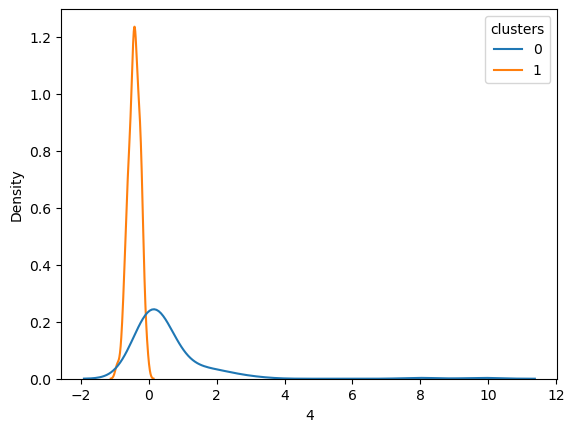

In [6]:
corr_df = pd.DataFrame(pca_df)
corr_df['clusters'] = clusters
sns.kdeplot(data=corr_df, x=corr_df.iloc[:,4], hue='clusters')
# sns.kdeplot(corr_df[corr_df.clusters==0].iloc[:,:-1])


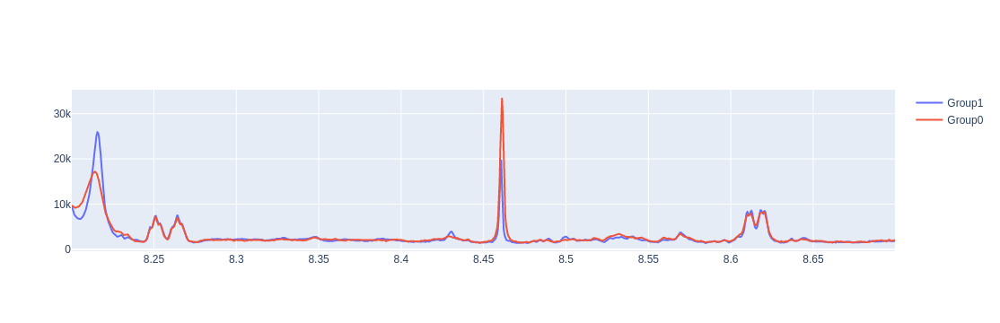

In [7]:
fig_df = nmr_peaks.iloc[:, 3:]
fig_df['clusters'] = clusters
# plt.figure(figsize=(15,8))
# sns.scatterplot(y=fig_df[fig_df.clusters == 1].iloc[:, :-1].mean()[15000:16000], x=x_axis[15000:16000], s=10)
# sns.scatterplot(y=fig_df[fig_df.clusters == 0].iloc[:, :-1].mean()[15000:16000], x=x_axis[15000:16000], s=10)

line1 = go.Scatter(y=fig_df[fig_df.clusters == 1].iloc[:, :-1].mean()[15000:16000], x=x_axis[15000:16000],name='Group1')
line2 = go.Scatter(y=fig_df[fig_df.clusters == 0].iloc[:, :-1].mean()[15000:16000], x=x_axis[15000:16000], name='Group0')
fig=dict(data=[line1,line2])
iplot(fig)

## Interactive Figures 

In [137]:
formate_100t10nn_classic = pd.read_csv('../classicRF_feature_impo_100t10nn_formate.csv').iloc[:, 1:]
formate_100t10nn_lavaset = pd.read_csv('../lavaset_feature_impo_100t10nn_formate.csv').iloc[:, 1:]

simgroups_100t10nn_classic = pd.read_csv('../classicRF_feature_impo_100t10nn_simulatedgroups_test.csv').iloc[:, 1:]
simgroups_100t10nn_lavaset = pd.read_csv('../lavaset_feature_impo_100t10nn_simulatedgroups_test.csv').iloc[:, 1:]

nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv')
x_axis = nmr_peaks.columns[3:].astype('float')
nmr_peaks_avg = nmr_peaks.iloc[:, 3:].mean(axis=0)

In [131]:
def make_importance_plot(results, title): 
    df = pd.DataFrame({'1':nmr_peaks_avg})
    df['gini importance'] = (results.iloc[:, 2].values)/np.sum(results.iloc[:,2]) # normalized by sum of all gini values 
    df['gini importance'] = df['gini importance']*100
    df['δ'] = x_axis
    # df['index'] = impo.index_i
    fig = px.scatter(df,x=df['δ'],y=df['1'], color='gini importance', title=title)
    fig.show()
    
def make_countseval_plot(ax, results, title):
    df = pd.DataFrame({'1':nmr_peaks_avg})
    df['times evaluated'] = results.iloc[:, 0].values
    df['δ'] = x_axis
    sns.histplot(ax=ax, data=df['times evaluated'])
    ax.set_title(title)

def make_countsel_plot(ax, results, title):
    df = pd.DataFrame({'1':nmr_peaks_avg})
    df['times selected'] = results.iloc[:, 1].values
    df['δ'] = x_axis
    sns.histplot(ax=ax, data=df['times selected'])
    ax.set_title(title)
    

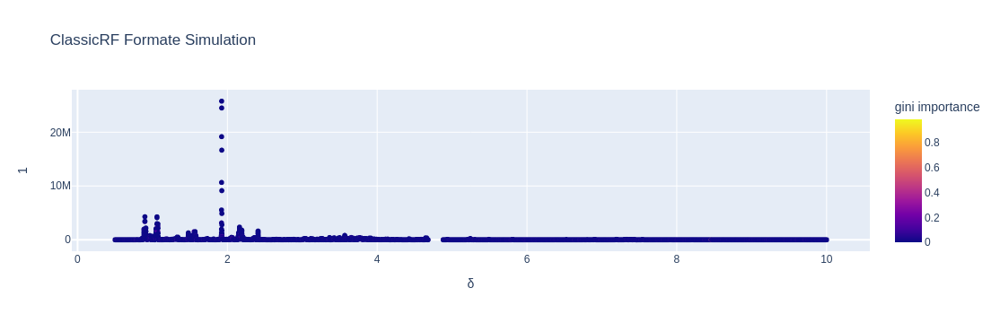

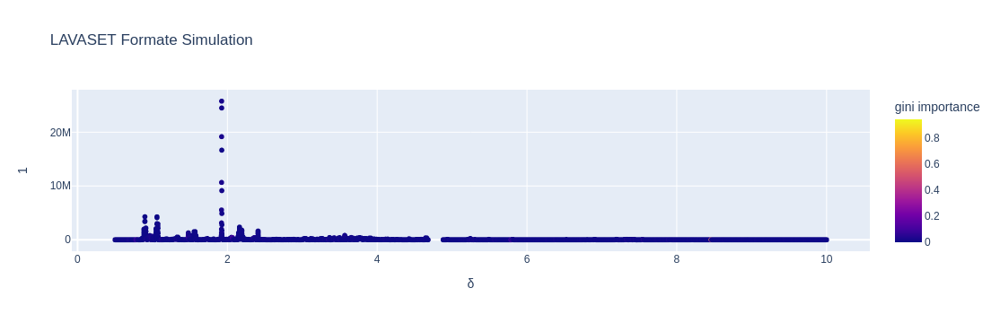

In [138]:
make_importance_plot(formate_100t10nn_classic, 'ClassicRF Formate Simulation')

make_importance_plot(formate_100t10nn_lavaset, 'LAVASET Formate Simulation')

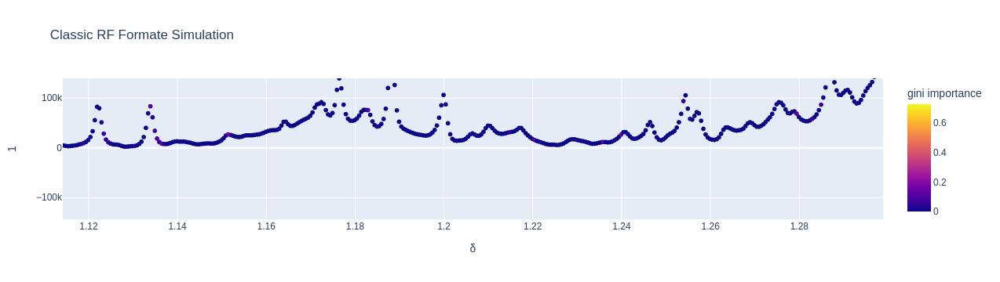

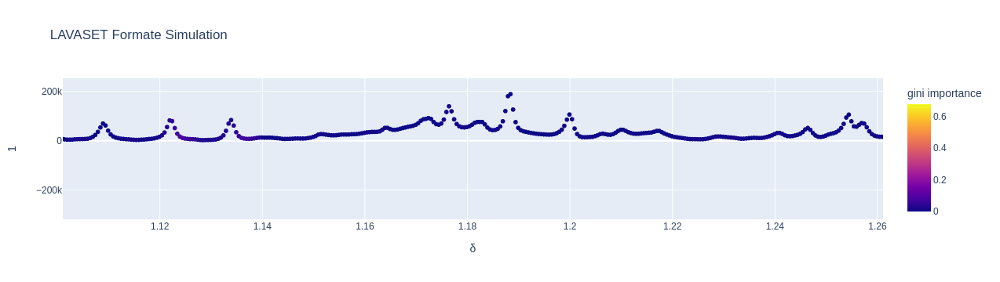

In [4]:
make_importance_plot(formate_100t10nn_classic, 'Classic RF Formate Simulation')
make_importance_plot(formate_100t10nn_lavaset, 'LAVASET Formate Simulation')


LAVASET 
- time for 100 trees: 112.33406901359558 sec<br>
- accuracy: 0.7777777777777778, <br> 0.8148148148148148 ([0.0 1.0 0.0 0.0 0.0 0.0 0.0 1.0 1.0 0.0 0.0 1.0 0.0 0.0 1.0 0.0 0.0 1.0
 0.0 1.0 0.0 0.0 1.0 0.0 1.0 0.0 0.0 0.0 1.0 0.0 1.0 0.0 1.0 0.0 1.0 0.0
 0.0 0.0 1.0 0.0 0.0 0.0 1.0 1.0 1.0 0.0 0.0 0.0 1.0 1.0 0.0 0.0 1.0 1.0]), random_state=15, 25 <br>
 0.8703703703703703 random_state = 90
- y_pred: [1.0 0.0 1.0 1.0 1.0 1.0 1.0 1.0 0.0 1.0 1.0 0.0 1.0 0.0 0.0 1.0 1.0 1.0
 1.0 0.0 1.0 1.0 0.0 1.0 0.0 1.0 1.0 1.0 0.0 1.0 0.0 1.0 0.0 1.0 0.0 1.0
 1.0 1.0 1.0 1.0 0.0 1.0 0.0 0.0 0.0 1.0 1.0 1.0 0.0 0.0 1.0 0.0 0.0 0.0]


classicRF 
- time for 100 trees: 6.485620737075806
- accuracy: 0.7407407407407407 random_state=15, 25 <br>
0.8333333333333334 random_state = 90
- y_pred: [1 0 1 1 1 1 1 0 0 1 1 0 0 1 0 1 1 0 1 0 1 1 0 1 0 1 1 1 0 1 0 1 0 1 0 1 1
 1 0 1 0 1 0 0 0 1 1 1 0 0 1 0 1 0], [0 1 0 0 0 0 0 1 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 1 1 0 0 0 1 0 1 0 1 0 1 0 0
 0 1 0 1 0 1 1 1 0 0 0 1 1 0 1 0 1]


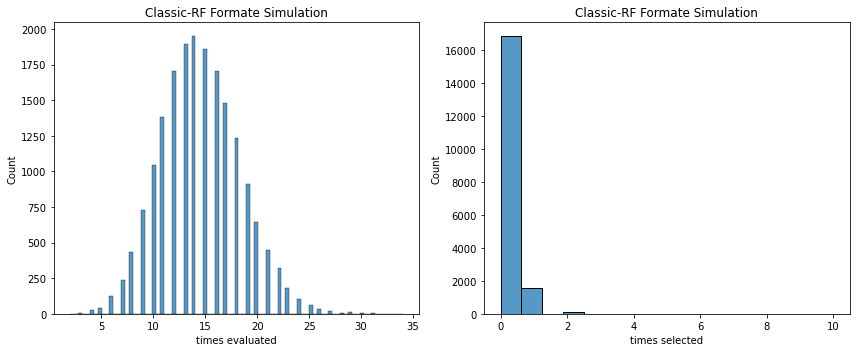

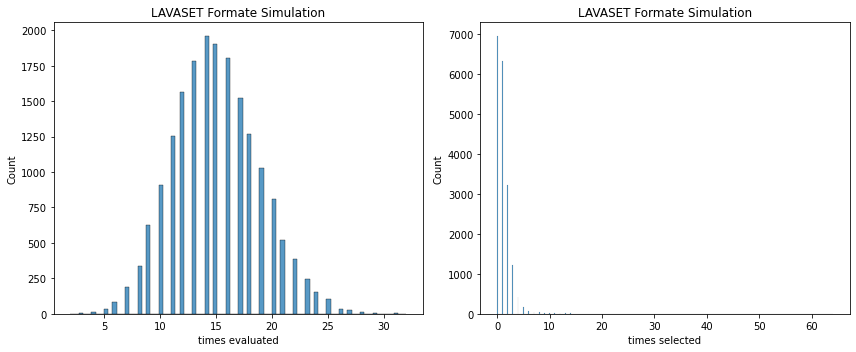

In [5]:

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
make_countseval_plot(axes[0], formate_100t10nn_classic, "Classic-RF Formate Simulation")
make_countsel_plot(axes[1], formate_100t10nn_classic, "Classic-RF Formate Simulation")
plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 2, figsize=(12, 5))
make_countseval_plot(axes[0], formate_100t10nn_lavaset, "LAVASET Formate Simulation")
make_countsel_plot(axes[1], formate_100t10nn_lavaset, "LAVASET Formate Simulation")
plt.tight_layout()
plt.show()


Generated a 2-class vector for the IBS data, used 2 compounds for this that each have 2 multiplets in the spectrum, and these signals are spread out.
 
In the first sheet you can see the class to use for classification, in the second sheet are the features used to generate the classes and how I would expect to see the associations (one compound is higher in one group, the other compound is higher in the other group): so the importance might be different between the two groups.
 
Do note that one of the compounds has some correlated features that are not marked, this is inherent in the data, and we can quantify this later on.
For now we’d expect to see that at least these features are deemed important by the classification models (LAVASET/RF), but there can probably be additional ones that are also important.
But this allows us to calculate a type of ‘recall’ for feature importance perhaps?

In [139]:
groups = pd.read_excel('../simulated_groups.xlsx', sheet_name=0)
features = df = pd.read_excel('../simulated_groups.xlsx', sheet_name=1)
features[features.compound =='ethanol']

,index,ppm,compound,associated_more_with_class
0,1346,1.172936,ethanol,2
1,1347,1.173436,ethanol,2
2,1348,1.173936,ethanol,2
3,1349,1.174436,ethanol,2
4,1350,1.174936,ethanol,2
...,...,...,...,...
139,6364,3.681839,ethanol,2
140,6365,3.682339,ethanol,2
141,6366,3.682839,ethanol,2
142,6367,3.683339,ethanol,2


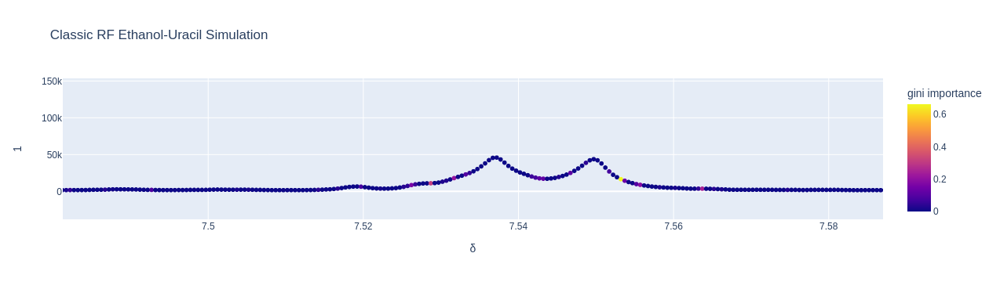

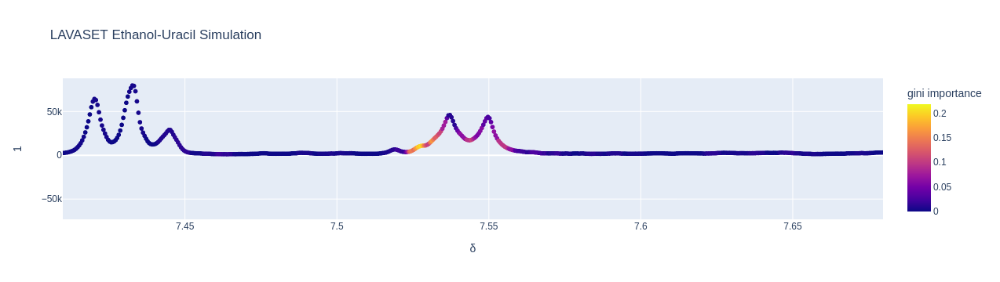

In [86]:
make_importance_plot(simgroups_100t10nn_classic, 'Classic RF Ethanol-Uracil Simulation')
make_importance_plot(simgroups_100t10nn_lavaset, 'LAVASET Ethanol-Uracil Simulation')

## Paper Figures

In [119]:
simgroups_100t10nn_lavaset
features[features.compound == 'ethanol']['index'].values

array([1346, 1347, 1348, 1349, 1350, 1351, 1352, 1353, 1354, 1355, 1356,
       1357, 1358, 1359, 1360, 1361, 1362, 1363, 1364, 1365, 1366, 1367,
       1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1378,
       1379, 1380, 1381, 1382, 1383, 1384, 1385, 1386, 1387, 1388, 1389,
       1390, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399, 1400,
       1401, 1402, 1403, 1404, 1405, 1406, 6286, 6287, 6288, 6289, 6290,
       6291, 6292, 6293, 6294, 6295, 6296, 6297, 6298, 6299, 6300, 6301,
       6302, 6303, 6304, 6305, 6306, 6307, 6308, 6309, 6310, 6311, 6312,
       6313, 6314, 6315, 6316, 6317, 6318, 6319, 6320, 6321, 6322, 6323,
       6324, 6325, 6326, 6327, 6328, 6329, 6330, 6331, 6332, 6333, 6334,
       6335, 6336, 6337, 6338, 6339, 6340, 6341, 6342, 6343, 6344, 6345,
       6346, 6347, 6348, 6349, 6350, 6351, 6352, 6353, 6354, 6355, 6356,
       6357, 6358, 6359, 6360, 6361, 6362, 6363, 6364, 6365, 6366, 6367,
       6368])

In [114]:
features['index']

0       1346
1       1347
2       1348
3       1349
4       1350
       ...  
229    13706
230    13707
231    13708
232    13709
233    13710
Name: index, Length: 234, dtype: int64

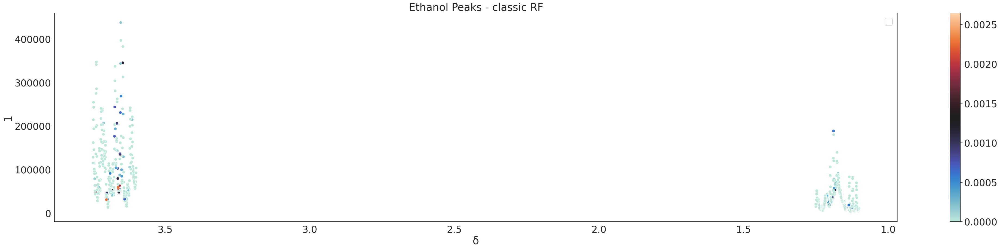

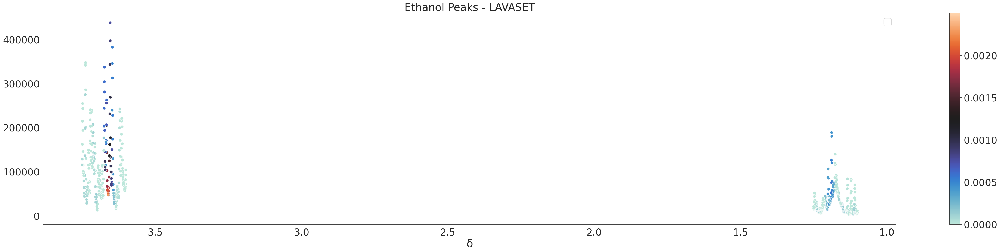

In [133]:
frange = range(1200,1500)
# df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
# # df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
# # df['gini importance'] = simgroups_100t10nn_lavaset.iloc[:, 2].values[frange]
# df['gini importance'] = (simgroups_100t10nn_lavaset.iloc[:, 2].values/np.sum(simgroups_100t10nn_lavaset.iloc[:,2]))[frange] # normalized by sum of all gini values 
# df['gini importance'] = df['gini importance']*100
# df['δ'] = x_axis[frange]

# # df = df[df['3']!=0]

# plt.figure(figsize=(50, 10))
# sns.set(font_scale=2.3,  style='white')
# # ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
# ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='magma_r', s=60)
# norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
# sm = plt.cm.ScalarMappable(cmap="magma_r", norm=norm)
# sm.set_array([])
# ax.invert_xaxis()
# plt.legend('')
# # ax.get_legend()
# ax.figure.colorbar(sm)

plt.figure(figsize=(50, 10))
sns.set(font_scale=2.3,  style='white')

franges = [range(1200,1500), range(6200,6500)]  # ethanol ranges

dfs = []  # List to hold dataframes

for frange in franges:
    df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
    df['gini importance'] = (simgroups_100t10nn_classic.iloc[:, 2].values/np.sum(simgroups_100t10nn_classic.iloc[:,2]))[frange]
    df['δ'] = x_axis[frange]
    dfs.append(df)

# Concatenate all dataframes
df_all = pd.concat(dfs, ignore_index=True)

# Create scatterplot
ax = sns.scatterplot(data=df_all, x=df_all['δ'], y=df_all['1'], hue='gini importance', palette='icefire', s=60)

norm = plt.Normalize(df_all['gini importance'].min(), df_all['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
sm.set_array([])

ax.invert_xaxis()
plt.legend('')
plt.title('Ethanol Peaks - classic RF')
ax.figure.colorbar(sm)


plt.figure(figsize=(50, 10))
sns.set(font_scale=2.3,  style='white')

franges = [range(1200,1500), range(6200,6500)]  # ethanol ranges

dfs = []  # List to hold dataframes

for frange in franges:
    df = pd.DataFrame({'':nmr_peaks_avg[frange]})
    df['gini importance'] = (simgroups_100t10nn_lavaset.iloc[:, 2].values/np.sum(simgroups_100t10nn_lavaset.iloc[:,2]))[frange]
    df['δ'] = x_axis[frange]
    dfs.append(df)

# Concatenate all dataframes
df_all = pd.concat(dfs, ignore_index=True)


# Create scatterplot
ax = sns.scatterplot(data=df_all, x=df_all['δ'], y=df_all[''], hue='gini importance', palette='icefire', s=60)

norm = plt.Normalize(df_all['gini importance'].min(), df_all['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
sm.set_array([])

ax.invert_xaxis()
plt.legend('')
plt.title('Ethanol Peaks - LAVASET')
ax.figure.colorbar(sm)



In [205]:
!pip install brokenaxes

/bin/bash: /home/mk218/anaconda3/envs/py39-CMR/lib/libtinfo.so.6: no version information available (required by /bin/bash)


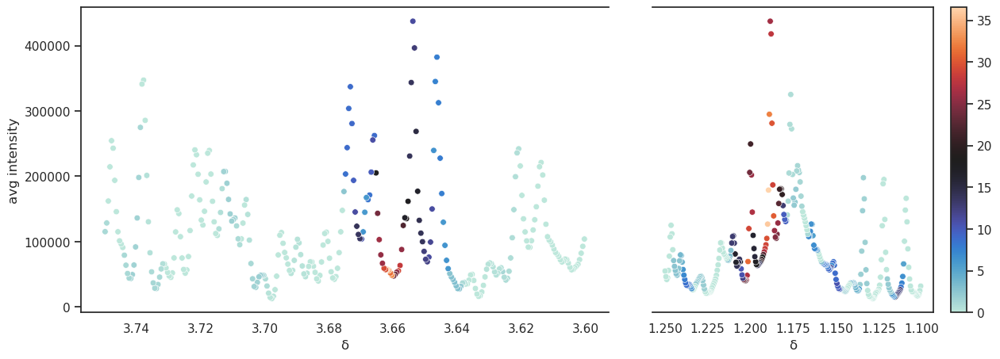

In [209]:
import matplotlib.gridspec as gridspec
ax[1].set_ylabel('')

# Prepare your data
franges = [range(6200,6500), range(1200,1500)]  # ethanol ranges
dfs = []  

for frange in franges:
    df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
    df['gini importance'] = simgroups_100t10nn_lavaset.iloc[:, 2].values[frange]
    df['δ'] = x_axis[frange]
    dfs.append(df)

# Concatenate all dataframes
df_all = pd.concat(dfs, ignore_index=True)
sns.set(font_scale=1,  style='white')

fig = plt.figure(figsize=(15,5))
gs = gridspec.GridSpec(1, 2, width_ratios=[30, 20]) 

ax = []
for i in range(2):
    ax.append(plt.subplot(gs[i]))
    sns.scatterplot(data=dfs[i], x=dfs[i]['δ'], y=dfs[i]['1'], hue='gini importance', palette='icefire', s=30, ax=ax[i], legend=False)
    norm = plt.Normalize(df_all['gini importance'].min(), df_all['gini importance'].max())
    sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
    sm.set_array([])
    ax[i].invert_xaxis()

# Hide the spines between ax[0] and ax[1]
ax[0].spines['right'].set_visible(False)
ax[1].spines['left'].set_visible(False)
ax[0].yaxis.tick_left()
ax[0].tick_params(labelright=False)
ax[1].tick_params(labelright=False, labelleft=False)
ax[0].set_ylabel('avg intensity')
ax[1].set_ylabel('')
ax[1].figure.colorbar(sm)

# Hide y-axis of the second subplot
plt.subplots_adjust(wspace=0.1)
plt.show()


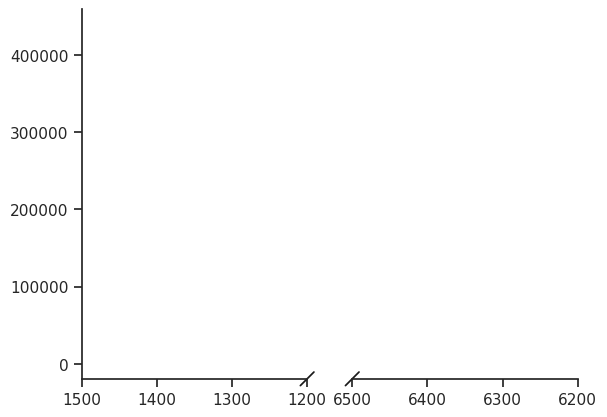

In [212]:
from brokenaxes import brokenaxes


# Prepare your data
franges = [range(1200,1500), range(6200,6500)]  # ethanol ranges
dfs = []  

for frange in franges:
    df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
    df['gini importance'] = simgroups_100t10nn_lavaset.iloc[:, 2].values[frange]
    df['δ'] = x_axis[frange]
    dfs.append(df)

# Concatenate all dataframes
df_all = pd.concat(dfs, ignore_index=True)

# Create broken x-axis
bax = brokenaxes(xlims=((1200, 1500), (6200, 6500)), hspace=.05)

for df in dfs:
    bax.scatter(df['δ'], df['1'], c=df['gini importance'], cmap="icefire", s=60)
    norm = plt.Normalize(df_all['gini importance'].min(), df_all['gini importance'].max())
    sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
    sm.set_array([])

bax.invert_xaxis()

plt.show()


In [ ]:
frange = range(1000,1400)
df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['gini importance'] = importances.values[frange]
df['gini importance'] = df['gini importance']*100
df['δ'] = x_axis[frange]

# df = df[df['3']!=0]
fig = plt.figure(figsize=(20, 10))
sns.set(font_scale=1.3,  style='white')
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='gnuplot', s=30)
norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])
# here the pink peak is isoleucine 


plt.ylabel('')
plt.legend('')
# ax.get_legend()
ax.figure.colorbar(sm)
#fig.savefig('isoleucine.tiff', format='tiff')

df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['gini importance'] = importances.values[frange]
df['gini importance'] = df['gini importance']*100
df['δ'] = x_axis[frange]



# df = df[df['3']!=0]
display(df['gini importance'].max())
plt.figure(figsize=(20, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='gnuplot', s=30)
norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])
plt.ylabel('')
plt.legend('')
# ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
simulated_groups

In [ ]:
cmr = pd.read_csv('HCM_HC_cmr_test.csv')
X = np.array(cmr.iloc[:, 1:-1])
y = np.array(cmr.iloc[:, -1])

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=20)
# print(pd.DataFrame(X_train))

df_train = pd.DataFrame(X_train)
display(df_train.shape)
df_test = pd.DataFrame(X_test)


In [ ]:
heart_hc = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1008480_lv_myoed_wallthickness.txt', sep=" ", header=None)
x = np.array(heart_hc.iloc[:, 0])
y = np.array(heart_hc.iloc[:, 1])
z = np.array(heart_hc.iloc[:, 2])
wt = np.array(cmr_importances)*100

fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
# wt = np.array(heart_hcm.iloc[:, 3][:20])
sc = ax.scatter(x, y, z, s=1, depthshade=True, c=wt, cmap='YlGnBu')
plt.title('Important Features')
plt.colorbar(sc)
plt.show()
#fig.savefig('3dventr.svg', format='svg', dpi=1200)

heart_hcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1008480_lv_myoed_wallthickness.txt', sep=" ", header=None)
x = np.array(heart_hcm.iloc[:, 0])
y = np.array(heart_hcm.iloc[:, 1])
z = np.array(heart_hcm.iloc[:, 2])
wt = np.array(heart_hcm.iloc[:, 3])

fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
# wt = np.array(heart_hcm.iloc[:, 3][:20])
sc = ax.scatter(x, y, z, s=3, depthshade=True, c=wt, cmap='YlGnBu')
plt.title('HC')
plt.colorbar(sc)
plt.show()


heart_hcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1985320_lv_myoed_wallthickness.txt', sep=" ", header=None)
x = np.array(heart_hcm.iloc[:, 0])
y = np.array(heart_hcm.iloc[:, 1])
z = np.array(heart_hcm.iloc[:, 2])
wt = np.array(heart_hcm.iloc[:, 3])

fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
# wt = np.array(heart_hcm.iloc[:, 3][:20])
sc = ax.scatter(x, y, z, s=1, depthshade=True, c=wt, cmap='YlGnBu')
plt.title('HCM')
plt.colorbar(sc)
plt.show()
#fig.savefig('3dventr.svg', format='svg', dpi=1200)

In [7]:
 nmr_peaks.columns[3:]

Index(['HC,IBS-subtypes=1-4', '0.5005', '0.5010', '0.5015', '0.5020', '0.5025',
       '0.5030', '0.5035', '0.5040', '0.5045',
       ...
       '9.9951', '9.9956', '9.9961', '9.9966', '9.9971', '9.9976', '9.9981',
       '9.9986', '9.9991', '9.9996'],
      dtype='object', length=18601)

In [21]:
X = nmr_peaks.columns[3:15].to_numpy(dtype=float)
display(X.shape)
if X.ndim == 1:
    print('its 1D vector')
X = np.append([X], [nmr_peaks.columns[3:15].to_numpy(dtype=float)], axis=0)
display(X.T.shape)


kdtree = KDTree(X.T)
# logging.warning('here')
points = kdtree.query(X.T,11)[1]
display(points)


X = nmr_peaks.iloc[:, 3:15].to_numpy(dtype=float)
# X = np.append([X], [nmr_peaks.iloc[:, 3:15].to_numpy(dtype=float)], axis=0)
display(X.T)
kdtree = KDTree(X.T)
# logging.warning('here')
dist, points = kdtree.query(X.T,11)
points
# pd.DataFrame(points).to_csv('nmr_20nn_index.csv', index=False)

(12,)

its 1D vector


(12, 2)

array([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10],
       [ 1,  2,  0,  3,  4,  5,  6,  7,  8,  9, 10],
       [ 2,  1,  3,  4,  0,  5,  6,  7,  8,  9, 10],
       [ 3,  4,  2,  5,  1,  6,  0,  7,  8,  9, 10],
       [ 4,  3,  5,  6,  2,  1,  7,  8,  0,  9, 10],
       [ 5,  6,  4,  7,  3,  8,  2,  9,  1, 10,  0],
       [ 6,  5,  7,  4,  8,  3,  9, 10,  2,  1, 11],
       [ 7,  8,  6,  5,  9, 10,  4, 11,  3,  2,  1],
       [ 8,  7,  9, 10,  6,  5, 11,  4,  3,  2,  1],
       [ 9, 10,  8, 11,  7,  6,  5,  4,  3,  2,  1],
       [10,  9, 11,  8,  7,  6,  5,  4,  3,  2,  1],
       [11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1]])

array([[1415.89933793, 1549.12559854, 2603.7116221 , ...,  384.94461213,
        3332.68181595, 2705.9750194 ],
       [2055.33199565, 1580.09031374, 1657.46492921, ..., 2222.58399632,
        2629.89110155,  549.29988136],
       [1780.55556829, 1484.27424158,  488.54208113, ..., 1390.41659581,
        2009.07195417, 1175.1821884 ],
       ...,
       [1734.25050985, 2619.78798822, 2003.0444541 , ..., 1459.23774301,
        1639.05816296, 1895.47111043],
       [1338.70535688, 3328.78592419, 2386.64537548, ..., 1508.57083831,
        2332.93544085, 1688.5567775 ],
       [2083.44363037, 2106.11903714, 3442.96621659, ..., 3116.93092119,
        1893.03288807,  982.96956783]])

array([[ 0,  1,  7,  2,  4,  3, 10,  8,  9,  6, 11],
       [ 1,  2,  0,  3,  4,  7,  6, 11, 10,  5,  9],
       [ 2,  3,  1,  4,  0,  6,  7,  9,  5, 10,  8],
       [ 3,  4,  2,  1,  5,  9,  6,  7, 10,  8,  0],
       [ 4,  3,  5,  6,  7,  2,  1, 10,  9,  8,  0],
       [ 5,  4,  6,  3,  7,  8,  9,  1, 10,  2, 11],
       [ 6,  7,  5,  8,  4,  3,  9,  2,  1, 10, 11],
       [ 7,  6,  8,  9,  4,  3,  5, 10,  0,  1, 11],
       [ 8,  9,  7,  6, 10,  5,  3,  4,  0,  1,  2],
       [ 9,  8, 10,  7,  3, 11,  6,  4,  5,  1,  2],
       [10, 11,  9,  3,  4,  8,  7,  6,  1,  0,  5],
       [11, 10,  9,  1,  6,  7,  4,  3,  0,  8,  5]])

In [ ]:
heart_hc = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1008480_lv_myoed_wallthickness.txt', sep=" ", header=None)
heart_hcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1985320_lv_myoed_wallthickness.txt', sep=" ", header=None)

In [ ]:
X = heart_hc.iloc[:, :-1]
# print(X.iloc[2])
#X = (np.array(data.iloc[0, :])).flatten()

kdtree = KDTree(X)
# logging.warning('here')
dist, points = kdtree.query(X,101)
print(points)
pd.DataFrame(points).to_csv('cmr_100nn_index.csv', index=False)



In [ ]:
x_axis = nmr_peaks.columns.astype('float')
nmr_peaks_avg = nmr_peaks.mean(axis=0)


In [ ]:
frange = range(12000,14000)
df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['gini importance'] = importances3.values[frange]
df['gini importance'] = df['gini importance']*100
df['δ'] = x_axis[frange]

# df = df[df['3']!=0]
fig = plt.figure(figsize=(20, 10))
sns.set(font_scale=1.3,  style='white')
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='gnuplot', s=30)
norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])
# here the pink peak is isoleucine 


plt.ylabel('')
plt.legend('')
# ax.get_legend()
ax.figure.colorbar(sm)
#fig.savefig('isoleucine.tiff', format='tiff')

df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['gini importance'] = importances4.values[frange]
df['gini importance'] = df['gini importance']*100
df['δ'] = x_axis[frange]



# df = df[df['3']!=0]
display(df['gini importance'].max())
plt.figure(figsize=(20, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='gnuplot', s=30)
norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])
plt.ylabel('')
plt.legend('')
# ax.get_legend()
ax.figure.colorbar(sm)




In [ ]:
#frange = range(500,1500)
df = pd.DataFrame({'1':nmr_peaks_avg})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['gini importance'] = importances3.values
df['gini importance'] = df['gini importance']*100
df['δ'] = x_axis
# df = df[df['3']!=0]
fig = plt.figure(figsize=(30, 10))
sns.set(font_scale=1.3,  style='white')
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='gnuplot', s=30)
norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])
# here the pink peak is isoleucine 


plt.ylabel('')
plt.legend('')
# ax.get_legend()
ax.figure.colorbar(sm)
#fig.savefig('isoleucine.tiff', format='tiff')

df = pd.DataFrame({'1':nmr_peaks_avg})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['gini importance'] = importances4.values
df['gini importance'] = df['gini importance']*100
df['δ'] = x_axis
# df = df[df['3']!=0]
display(df['gini importance'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x=df['δ'],y=df['1'], hue='gini importance', palette='gnuplot', s=30)
norm = plt.Normalize(df['gini importance'].min(), df['gini importance'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])
plt.ylabel('')
plt.legend('')
# ax.get_legend()
ax.figure.colorbar(sm)


In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg})
df['2'] = list(range(0, nmr_peaks_10k15k.iloc[1, :].shape[0]))  
df['3'] = importances.values
df['3'] = df['3']



# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)
display(df)

In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv').iloc[:, 3:]
impo_sk = pd.read_csv('feature_impo_pca_15_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)
frange = range(1500,2500)
df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
df['2'] = list(range(0, nmr_peaks.iloc[1, frange].shape[0]))  
df['3'] = impo_sk.values[frange]
df['3'] = df['3']*100

# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(20, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)


impo_sk = pd.read_csv('feature_impo_pca_100_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)
frange = range(1500,2500)
df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
df['2'] = list(range(0, nmr_peaks.iloc[1, frange].shape[0]))  
df['3'] = impo_sk.values[frange]
df['3'] = df['3']*100

# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(20, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv').iloc[:, 3:]
impo_sk = pd.read_csv('feature_impo_pca_10t50nn.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)
frange = range(12000,14000)
df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
df['2'] = list(range(0, nmr_peaks.iloc[1, frange].shape[0]))  
df['3'] = impo_sk.values[frange]
df['3'] = df['3']*100

# df = df[df['3']!=0]
plt.figure(figsize=(20, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)


impo_sk = pd.read_csv('feature_impo_pca_100_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)
frange = range(12000,14000)
df = pd.DataFrame({'1':nmr_peaks_avg[frange]})
df['2'] = list(range(0, nmr_peaks.iloc[1, frange].shape[0]))  
df['3'] = impo_sk.values[frange]
df['3'] = df['3']*100

# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(20, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [8]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv').iloc[:, 3:]
impo_sk = pd.read_csv('feature_impo_pca_15_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)

df = pd.DataFrame({'1':nmr_peaks_avg[2000:4000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 2000:4000].shape[0]))  
df['3'] = impo_sk.values[2000:4000]
df['3'] = df['3']*100

# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(50, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)
display(df)

FileNotFoundError: [Errno 2] No such file or directory: 'feature_impo_pca_15_all_features.csv'

In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv').iloc[:, 3:]
impo_sk = pd.read_csv('feature_impo_pca_10_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)

df = pd.DataFrame({'1':nmr_peaks_avg[2000:4000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 2000:4000].shape[0]))  
df['3'] = impo_sk.values[2000:4000]
df['3'] = df['3']*100

# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(50, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)
display(df)

In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv').iloc[:, 3:]
impo_sk = pd.read_csv('feature_impo_10_all_features.csv').iloc[:, 1:]
nmr_peaks_avg = nmr_peaks.mean(axis=0)

df = pd.DataFrame({'1':nmr_peaks_avg[2000:5000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 2000:5000].shape[0]))  
df['3'] = impo_sk.values[2000:5000]
df['3'] = df['3']*100



# df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(50, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='gnuplot', s=30)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="gnuplot", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)
display(df)

In [ ]:
nmr_peaks.iloc[1, 10000:150000]

In [ ]:
leaves_lavaset = pd.read_csv('bonsai-dt/bonsai/leaves_lavaset10v2.csv')
# for i in leaves_lavaset['eqs'][:100]:
#     print(i)
leaves_lavaset.iloc[1, 1]

In [ ]:
leaves_lavaset.iloc[2, 1]

In [ ]:
nmr_peaks_avg = nmr_peaks.mean(axis=0)
# nmr_peaks_avg.index

In [ ]:
importances = pd.read_csv('bonsai-dt/bonsai/feature_impo_pca_RF10_v2.csv').iloc[:, 1:]
df = pd.DataFrame({'1':nmr_peaks_avg})
df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['3'] = importances.values
df['3'] = df['3']



df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='viridis', s=10)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)
display(df)

In [ ]:
# fig = plt.figure(figsize=(15, 10))
# sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks_avg[:4000].shape[0]))
# fig.savefig('specturm.svg', format='svg', dpi=1200)

heart_hcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1985320_lv_myoed_wallthickness.txt', sep=" ", header=None)
x = np.array(heart_hcm.iloc[:, 0])
y = np.array(heart_hcm.iloc[:, 1])
z = np.array(heart_hcm.iloc[:, 2])
wt = np.array(heart_hcm.iloc[:, 3])

fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
# wt = np.array(heart_hcm.iloc[:, 3][:20])
sc = ax.scatter(x, y, z, s=1, depthshade=True, c=wt, cmap='YlGnBu')
# plt.title('HCM')
# plt.colorbar(sc)
plt.show()
fig.savefig('3dventr.svg', format='svg', dpi=1200)




In [ ]:
importances[:4000]['0'].unique()

In [ ]:
unique = importances[:4000]['0'].unique()
display(unique)
palette = dict(zip(unique, sns.color_palette(n_colors=len(unique))))


In [ ]:
from sklearn.metrics import accuracy_score
test = [1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]
pred = [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0]
print(accuracy_score(test, pred))

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[0:2500]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 0:2500].shape[0]))  
df['3'] = importances.values[0:2500]
df

# df = pd.DataFrame({'1':nmr_peaks_avg})
# df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
# df['3'] = importances.values
# df

# df = df[df['3']!=0].reset_index()
df['3'] = df['3']*1000
df

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[0:2500]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 0:2500].shape[0]))  
df['3'] = importances.values[0:2500]
df['3'] = df['3']*1000

display(df[2400:2500])

df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='Spectral', s=10)
# norm = plt.Normalize(df['3'].min(), df['3'].max())
# sm = plt.cm.ScalarMappable(cmap="Spectral", norm=norm)
# sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[2500:5000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 2500:5000].shape[0]))  
df['3'] = importances.values[2500:5000]
# df['3'] = df['3']*1000
display(df)

df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='Spectral', s=10)
# norm = plt.Normalize(df['3'].min(), df['3'].max())
# sm = plt.cm.ScalarMappable(cmap="Spectral", norm=norm)
# sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[5000:10000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 5000:10000].shape[0]))  
df['3'] = importances.values[5000:10000]
# df['3'] = df['3']*1000
display(df)

df = df[df['3']!=0]
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='Spectral', s=10)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="Spectral", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[11:18588]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 11:18588].shape[0]))  
df['3'] = importances.values[11:18588]
# df['3'] = df['3']*1000
display(df)

df = df[df['3']!=0]
display(df['3'].min())
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='viridis', s=10)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[11:2000]})
df['2'] = list(range(0, nmr_peaks.iloc[1, 11:2000].shape[0]))  
df['3'] = importances.values[11:2000]
# df['3'] = df['3']*1000
display(df)

df = df[df['3']!=0]
display(df['3'].min())
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='viridis', s=10)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
display(df[df['2'].isin(range(1450,1550))])
# display(df[df['2'].isin(range(11, 18588))].max())

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg})
df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['3'] = importances.values
# df['3'] = df['3']*1000
display(df)

df = df[df['3']!=0]
display(df['3'].min())
display(df['3'].max())
plt.figure(figsize=(30, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
ax = sns.scatterplot(data=df,x='2',y='1', hue='3', palette='viridis', s=10)
norm = plt.Normalize(df['3'].min(), df['3'].max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

ax.get_legend()
ax.figure.colorbar(sm)

In [ ]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 100)
display(df[df['2'].isin(range(18550,18600))])
display(df[df['2'].isin(range(11, 18588))].max())

In [ ]:
df = pd.DataFrame({'1':nmr_peaks_avg[7000:10000].values})
df['2'] = list(range(0, nmr_peaks.iloc[1, 7000:10000].shape[0]))  
df['3'] = importances[7000:10000].values
df

df = pd.DataFrame({'1':nmr_peaks_avg.values})
df['2'] = list(range(0, nmr_peaks.iloc[1, :].shape[0]))  
df['3'] = importances.values
df = df[df['3']!=0].reset_index()
df

In [ ]:
plt.figure(figsize=(15, 10))
# ax = sns.lineplot(y=nmr_peaks_avg[:4000], x=range(0, nmr_peaks.iloc[1, :4000].shape[0]),hue=importances[:4000], palette = palette)
sns.scatterplot(data=df,x='2',y='1', hue='3', palette='hsv')

In [ ]:
sns.scatterplot(y= nmr_peaks.iloc[1,:], x=range(0, nmr_peaks.iloc[1, :].shape[0]), hue=dict(zip(range(0,  nmr_peaks.iloc[1, :].shape[0]),importances.iloc[:, 0])))
# sns.lineplot(x=feat.iloc[:, 0], y=feat.iloc[:, 1])
plt.xlabel('NMR variables')
plt.ylabel('Importance')

In [ ]:
pca_acc = np.array([0.6666666666666666,0.6481481481481481,0.5740740740740741, 0.6111111111111112, 0.6111111111111112, 0.5740740740740741])
no_pca_acc = np.array([0.6481481481481481, 0.5740740740740741, 0.5740740740740741, 0.6296296296296297, 0.6296296296296297, 0.6666666666666666])
display(round(np.mean(no_pca_acc),3), round(np.std(no_pca_acc),3))
display(round(np.mean(pca_acc),3), round(np.std(pca_acc),3))
scipy.stats.ttest_ind(pca_acc, no_pca_acc)

In [ ]:
metadata = pd.read_csv('~/Documents/metadata/ukbbMetaData.txt', sep="\t", header=0)
metadata['eid_47602'] = pd.to_numeric(metadata['eid_47602'], downcast='integer')
metadata['eid_18545'] = pd.to_numeric(metadata['eid_18545'], downcast='integer')
metadata['eid_40616'] = pd.to_numeric(metadata['eid_40616'], downcast='integer')
cmr_data = pd.read_csv('~/Documents/metadata/CMR_metadata_Mar20_K.txt', sep=' ')
cmr_data['eid_47602'] = pd.to_numeric(cmr_data['eid_47602'], downcast='integer')
cmr_data['eid_18545'] = pd.to_numeric(cmr_data['eid_18545'], downcast='integer')
cmr_data['eid_40616'] = pd.to_numeric(cmr_data['eid_40616'], downcast='integer')
metadata.hasCMR.value_counts()

In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv')

nmr_peaks.iloc[:, 3:]

In [ ]:
pd.DataFrame(points).to_csv('nmr_knn_index.csv', index=False)

In [ ]:
indexes = pd.read_csv('nmr_knn_index.csv')
indexes.iloc[0].tolist()


In [ ]:
# X = StandardScaler().fit_transform(nmr_peaks.iloc[:, 3:])
# kdtree = KDTree(X)
# # logging.warning('here')
# dist, points = kdtree.query_radius(X,r=130, return_distance=True)
# print(points)
# print(dist)

In [ ]:
heart_hcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1985320_lv_myoed_wallthickness.txt', sep=" ", header=None)
heart_dcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/3962620_lv_myoed_wallthickness.txt', sep=" ", header=None)
heart_dcm = heart_dcm.drop(3, axis=1)
heart_hcm = heart_hcm.drop(3, axis=1)
data = heart_dcm.apply(lambda r: tuple(r), axis=1).apply(np.array)
data2 = heart_hcm.apply(lambda r: tuple(r), axis=1).apply(np.array)
data = pd.DataFrame (data=[data, data2])
display(data)
print(data.loc[:, 45801])

## creating KDTree and taking the nearest neighbour points 
X = heart_hcm.iloc[:, :-1]
# print(X.iloc[2])
X = (np.array(data.iloc[0, :])).flatten()
print(X)
kdtree = KDTree(X)
# logging.warning('here')
dist, points = kdtree.query(X,11)
print(points)

In [ ]:
cmr_txt_ids = []
wt_df = np.zeros(46808)

# wt_df = pd.DataFrame()
for path, dirs, files in os.walk('/home/mk218/Documents/CMR_WT/27k_WT_txts'):
    print(path, dirs)
#     print(wt_df.shape)
    for filename in files:
        # wt = pd.read_csv(f'/home/mk218/Documents/CMR_WT/27k_WT_txts/{filename}', sep=" ", header=None).iloc[:, 3].to_numpy()
        # wt_df = np.vstack((wt_df, wt))
#         pd.concat([wt_df, wt])
        filename = filename.replace('_lv_myoed_wallthickness.txt','')
        cmr_txt_ids.append(float(filename))
cmr_txt_ids = [int(i) for i in cmr_txt_ids]



In [ ]:
cmr_df = metadata[metadata['eid_18545'].isin(cmr_txt_ids)]
hcm = cmr_df[cmr_df.hasHCM == True]
hcm
healthy = cmr_df[(cmr_df.hasanyCM == False) & (cmr_df.hasHypertension == False)]
healthy_ids = healthy[:25].eid_18545.tolist()
hcm_ids = hcm.eid_18545.tolist()

In [ ]:
umapdf = pd.DataFrame(wt_df[1:], columns=range(0, 46808))

In [ ]:
fit = umap.UMAP(n_neighbors=100,
        min_dist=1,
        n_components=2,
        metric='euclidean')
%time u_ham = fit.fit_transform(umapdf)

In [ ]:
pd.DataFrame(u_ham)

In [ ]:
plt.figure(figsize=(13,7))
sns.scatterplot(x=0, y=1, data=pd.DataFrame(u_ham), palette='Set1', s=20)
plt.xlabel('UMAP\N{SUBSCRIPT ONE}')
plt.ylabel('UMAP\N{SUBSCRIPT TWO}')

In [ ]:
cmr_txt_ids_meta = metadata[metadata['eid_18545'].isin(cmr_txt_ids)]
display(cmr_txt_ids_meta[cmr_txt_ids_meta.hasanyCM == True].shape)
display(cmr_txt_ids_meta[cmr_txt_ids_meta.hasDCM == True].shape)
display(cmr_txt_ids_meta[cmr_txt_ids_meta.hasHCM == True].shape)

In [ ]:
umap_dist = pd.read_csv('umap_dist.csv', usecols=[1,2,3])
umap_dist 

In [ ]:
round(0.5)

In [ ]:
sns.set_style("darkgrid")
sns.set_context(context='paper',font_scale=1.5)


fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
wt = np.array(heart_hcm.iloc[:, 3])

sc = ax.scatter(umap_dist.iloc[:, 1], umap_dist.iloc[:, 0], umap_dist.iloc[:, 2], s=2, c=wt, depthshade=True, cmap='YlGnBu')



plt.title('UMAP')
plt.xlabel('UMAP\N{SUBSCRIPT ONE}')
plt.ylabel('UMAP\N{SUBSCRIPT TWO}')
plt.show()



In [ ]:
heart_hcm = pd.read_csv(
    '../CMR_WT/27k_WT_txts/1985320_lv_myoed_wallthickness.txt', sep=" ", header=None)
x = np.array(heart_hcm.iloc[:, 0])
y = np.array(heart_hcm.iloc[:, 1])
z = np.array(heart_hcm.iloc[:, 2])
wt = np.array(heart_hcm.iloc[:, 3])

fig = plt.figure(1, figsize=(15,10))
ax = plt.axes(projection="3d")
# wt = np.array(heart_hcm.iloc[:, 3][:20])
sc = ax.scatter(x, y, z, s=3, depthshade=True, c=wt, cmap='YlGnBu')
plt.title('HCM')
plt.colorbar(sc)
plt.show()


In [ ]:
X = heart_hcm.iloc[:, :-1]
# kdtree = KDTree(X)
# dist, points = kdtree.query(X,11)

dist_matrix = distance_matrix(X,X)
print(dist_matrix)



In [ ]:
no_zeros = np.concatenate(dist_matrix).ravel()
no_zeros = no_zeros[no_zeros != 0]
print(no_zeros)


In [ ]:
nmr_peaks = pd.read_csv('~/Documents/IBS/NMR_data/IBS_HNMR_data_n267.csv')
display(nmr_peaks)
X = np.array(nmr_peaks.iloc[:10, 3:12])
y = np.array(nmr_peaks.iloc[:10, 1])
display(pd.DataFrame(X))
display(X[0:8,3:3])

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
display(pd.DataFrame(X_train))

In [ ]:
x_min =np.nanpercentile(X_train, q=0.5, axis=0)
x_max = np.nanpercentile(X_train, q=99.5, axis=0)
j=0
x_j = X_train[~np.isnan(X_train[:,j]),j]
display(x_j)
unique_values = np.unique(x_j)
display(unique_values)
display(x_min, x_max)
mask = np.logical_and(unique_values >= x_min[j], unique_values <= x_max[j])
n_unique = np.sum(mask)
n_bin = max(n_unique, 1)
(x_max[j] - x_min[j])/n_bin
max(n_bin - 1, 1)

In [ ]:
# pca_df = 0
# X = np.array(nmr_peaks.iloc[:, 3:30])
# display(X)
# display(pd.DataFrame(X))
# display((X[:, 1]))
# display(pd.DataFrame(X[:, :(3+10)]))
# X_pca = StandardScaler().fit_transform(X[:, (1-10):(1+10)])
# display(pd.DataFrame(X_pca))
# pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca))


In [ ]:
# pca_df = []
pca_df = np.zeros((X.shape[0],1)) # initiating nested array with array number = # of samples
for f_idx in range(50):
    if f_idx < 10:
        indeces = list(range(f_idx-10, f_idx+10))
        indeces = [i for i in indeces if i>=0]
        X_pca = StandardScaler().fit_transform(X[:, indeces])# takes value for relevant feature in all training samples 
        # pca_df = np.insert(pca_df, obj=f_idx, values=PCA(n_components=1).fit_transform(X_pca), axis=0)
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca), axis=1)

    elif f_idx > (50-10):
        indeces = list(range(f_idx-10, 50))
        indeces = [i for i in indeces if i>=0]
        X_pca = StandardScaler().fit_transform(X[:, indeces])# takes value for relevant feature in all training samples 
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca), axis=1)
    elif f_idx > 10:
        indeces = list(range(f_idx-10, f_idx+10))
        X_pca = StandardScaler().fit_transform(X[:, indeces])# takes value for relevant feature in all training samples 
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca), axis=1)
pca_df = np.delete(pca_df, np.s_[0], 1) # deleting the initiating 0's values
display(pd.DataFrame(pca_df))                

In [ ]:
pca_df = 0
for f_idx in range(X.shape[1]):
    indeces = list(range(f_idx-10, f_idx+10)
    
    if f_idx > 10:
        X_pca = StandardScaler().fit_transform(X[:, (f_idx-10):(f_idx+10)]) # takes value for relevant feature in all training samples 
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca))
    if f_idx < 10: 
        X_pca = StandardScaler().fit_transform(X[:, :(f_idx+10)])
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca))
    if f_idx > (X.shape[1]-10):
        X_pca = StandardScaler().fit_transform(X[:, (f_idx-10):])
        pca_df = np.append(pca_df, PCA(n_components=1).fit_transform(X_pca))
pd.DataFrame(pca_df).to_csv('pca_df2.csv')
#    pca_df.to_csv('pca_df.csv')
    


In [ ]:
3739/267

In [ ]:
df = pd.read_csv('pca_df2.csv')
df

In [ ]:
pca1.explained_variance_

In [ ]:
pca2.explained_variance_